# **Lab 4: Advanced Edge Detection & Post-processing with Morphological Operations and Pattern Matching**
# **(Part II)**

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

This lab will guide students through detecting edges in an image, enhancing the edges using morphological operations, extracting shapes using pattern matching techniques like the Hough Transform, and applying edge detection in real-world contexts like contour detection and object segmentation.


By the end of this lab, students will be able to:

1- Apply multiple edge detection methods and compare their effectiveness.

2- Evaluate edge quality and robustness under different conditions.

3- Use morphological operations to enhance or clean up edge maps.

4- Apply shape detection techniques (like the Hough Transform) to extract and analyze structures.

5- Reflect on the role of post-processing in preparing edges for higher-level vision tasks.


## **Lab Structure**
This lab is divided into four Manipulations, shared on two parts:

 **Part I**
- **Manipulation I: Edge detection & comparison.**
- **Manipulation II: Edge post-processing using morphological operations.**

**Part II**
- **Manipulation III: Shape detection using the Hough transform.**
- **Manipulation IV: Edge post-processing and quality evaluation (reflection and analyzing)**

Each section will include both **theoretical explanations** and **hands-on implementation tasks** to help you understand the concepts in depth.

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Understanding the libraries used
Before starting the lab, provide a brief definition of the following libraries and their role in image processing:

- **OpenCV**: Open Source Computer Vision Library, primarily used for image and video processing tasks such as geometric transformations, filtering, and morphological operations.
  
- **NumPy**: A fundamental package for numerical computing in Python, providing support for arrays, matrices, and mathematical functions used in image processing.
  
- **Matplotlib**: A plotting library for Python that enables visualization of images, histograms, and transformations applied to images.

If not installed, you can install them using:

`pip install opencv-python numpy matplotlib`

In [1]:
import os
import glob
import math
import numpy as np
import cv2
import matplotlib.pyplot as plt

try:
    from skimage.transform import hough_line, hough_line_peaks
    SKIMAGE_OK = True
except Exception:
    SKIMAGE_OK = False

plt.rcParams["figure.dpi"] = 110

def find_file(name):
    candidates = [
        os.path.join(os.getcwd(), name),
        os.path.join(os.getcwd(), "Images", name),
        os.path.join(os.getcwd(), "Illustrations", name),
        os.path.join(os.getcwd(), "images", name),
        os.path.join(os.getcwd(), "illustrations", name),
    ]
    for c in candidates:
        if os.path.exists(c):
            return c
    recursive = glob.glob(os.path.join(os.getcwd(), "**", name), recursive=True)
    return recursive[0] if recursive else None

def read_gray(name):
    path = find_file(name)
    if path is None:
        print(f"[WARN] Could not find {name}")
        return None
    img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        print(f"[WARN] Could not read {name}")
    return img

def read_bgr(name):
    path = find_file(name)
    if path is None:
        print(f"[WARN] Could not find {name}")
        return None
    img = cv2.imread(path, cv2.IMREAD_COLOR)
    if img is None:
        print(f"[WARN] Could not read {name}")
    return img

def to_rgb(img):
    if img is None:
        return None
    if img.ndim == 2:
        return img
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

def show_grid(images, titles=None, cols=3, figsize=(15, 8), cmap='gray'):
    valid = [(im, titles[i] if titles else "") for i, im in enumerate(images) if im is not None]
    if not valid:
        print("[WARN] Nothing to display")
        return
    rows = int(np.ceil(len(valid) / cols))
    plt.figure(figsize=figsize)
    for i, (img, title) in enumerate(valid, 1):
        plt.subplot(rows, cols, i)
        if img.ndim == 2:
            plt.imshow(img, cmap=cmap)
        else:
            plt.imshow(to_rgb(img))
        plt.title(title)
        plt.axis("off")
    plt.tight_layout()
    plt.show()

def add_gaussian_noise(img, sigma=20):
    noise = np.random.normal(0, sigma, img.shape).astype(np.float32)
    out = np.clip(img.astype(np.float32) + noise, 0, 255).astype(np.uint8)
    return out

def add_salt_pepper_noise(img, amount=0.03, salt_vs_pepper=0.5):
    out = img.copy()
    num = int(amount * img.size)
    coords = tuple(np.random.randint(0, s, num) for s in img.shape)
    split = int(num * salt_vs_pepper)
    out[tuple(c[:split] for c in coords)] = 255
    out[tuple(c[split:] for c in coords)] = 0
    return out

def binary_otsu(gray, inv=False):
    flag = cv2.THRESH_BINARY_INV if inv else cv2.THRESH_BINARY
    _, th = cv2.threshold(gray, 0, 255, flag + cv2.THRESH_OTSU)
    return th

def binary_adaptive(gray, inv=True):
    flag = cv2.THRESH_BINARY_INV if inv else cv2.THRESH_BINARY
    return cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, flag, 21, 9)

def overlay_lines(img_bgr, lines, probabilistic=False, color=(0, 0, 255), thickness=2):
    out = img_bgr.copy()
    if lines is None:
        return out
    if probabilistic:
        for line in lines[:, 0]:
            x1, y1, x2, y2 = line
            cv2.line(out, (x1, y1), (x2, y2), color, thickness)
    else:
        h, w = out.shape[:2]
        for line in lines[:, 0]:
            rho, theta = line
            a, b = np.cos(theta), np.sin(theta)
            x0, y0 = a * rho, b * rho
            pt1 = (int(x0 + 1500 * (-b)), int(y0 + 1500 * a))
            pt2 = (int(x0 - 1500 * (-b)), int(y0 - 1500 * a))
            cv2.line(out, pt1, pt2, color, thickness)
    return out

def draw_circles(img_bgr, circles, color=(0, 255, 0)):
    out = img_bgr.copy()
    if circles is not None:
        circles = np.round(circles[0]).astype(int)
        for x, y, r in circles:
            cv2.circle(out, (x, y), r, color, 2)
            cv2.circle(out, (x, y), 2, (0, 0, 255), 3)
    return out

def edge_quality_metrics(edge_img):
    e = (edge_img > 0).astype(np.uint8)
    num_edge_pixels = int(e.sum())
    num_labels, _, stats, _ = cv2.connectedComponentsWithStats(e, connectivity=8)
    areas = stats[1:, cv2.CC_STAT_AREA] if num_labels > 1 else np.array([])
    avg_component_size = float(areas.mean()) if len(areas) else 0.0
    return {
        "edge_pixels": num_edge_pixels,
        "num_components": int(max(num_labels - 1, 0)),
        "avg_component_size": round(avg_component_size, 2)
    }

-------------------------------------------------------------------------------------------------------------------------------

-------------------------------------------------------------------------------------------------------------------------------

# Manipulation 2: Edge post-processing using morphological operations


## **Task 3: Morphological Operators & post-processing**

**Introduction**
Fingerprint images are often noisy, have broken ridges, and contain scanning artifacts. Morphological operations can clean and enhance these images before analysis or matching.

We will learn:

- How to apply those operators on a real life cases

- how to repair broken fingerprint patterns

- how to remove small irrelevant components (artifacts)

**What to do?**

1- **Preprocessing:**

- Load the fingerprint image: 102_4.tif; 101_8.tif

- Convert to grayscale and then to binary (use cv2.threshold or cv2.adaptiveThreshold).

2- **Clean the Image:**

- Apply morphological opening to remove small noise dots.

- Use morphological closing to reconnect slightly broken ridges.

3- **Ridge Enhancement:**

- Use dilation to slightly thicken the ridge lines (if too faint).

4- **Reflection & Analysis Questions:**

- *Effect of Kernel*: What changes when using a 3x3 vs. 5x5 kernel? Rect vs. ellipse?

- *Operator Sequence*: What happens if you apply closing before opening vs. opening before closing?

- *Noise Simulation:* Add salt & pepper noise to the original image and see how robust your pipeline is. How can you make it more robust?

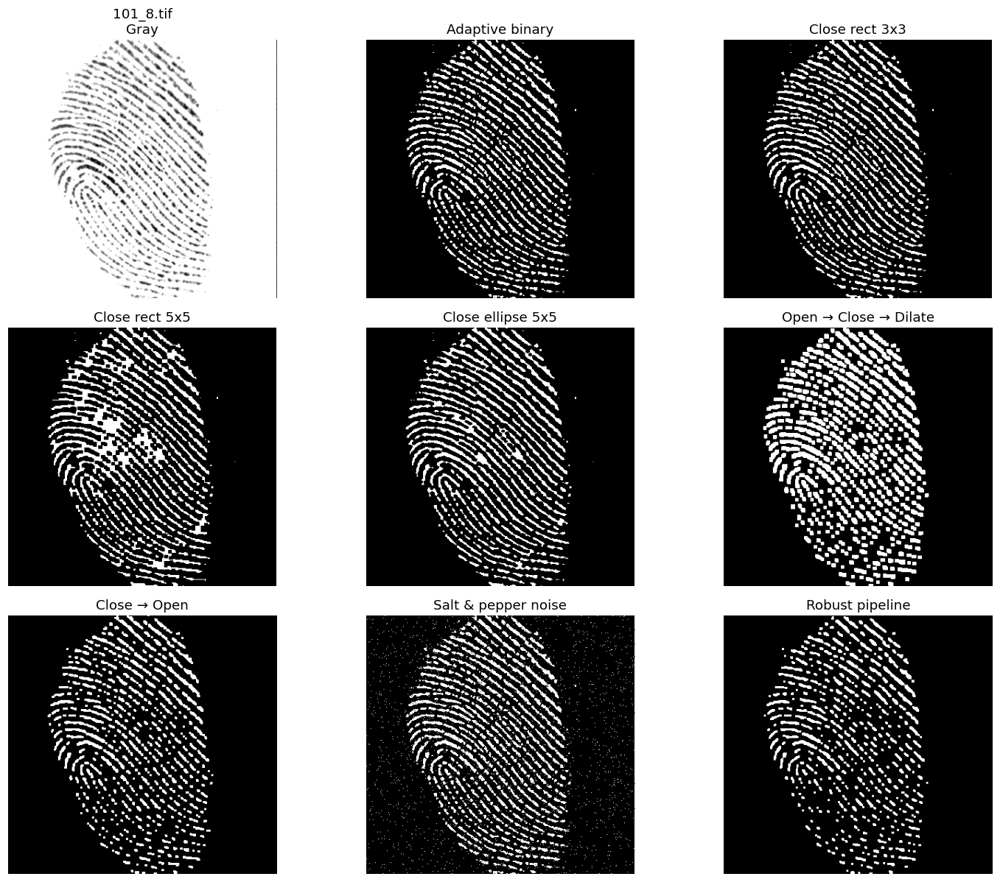

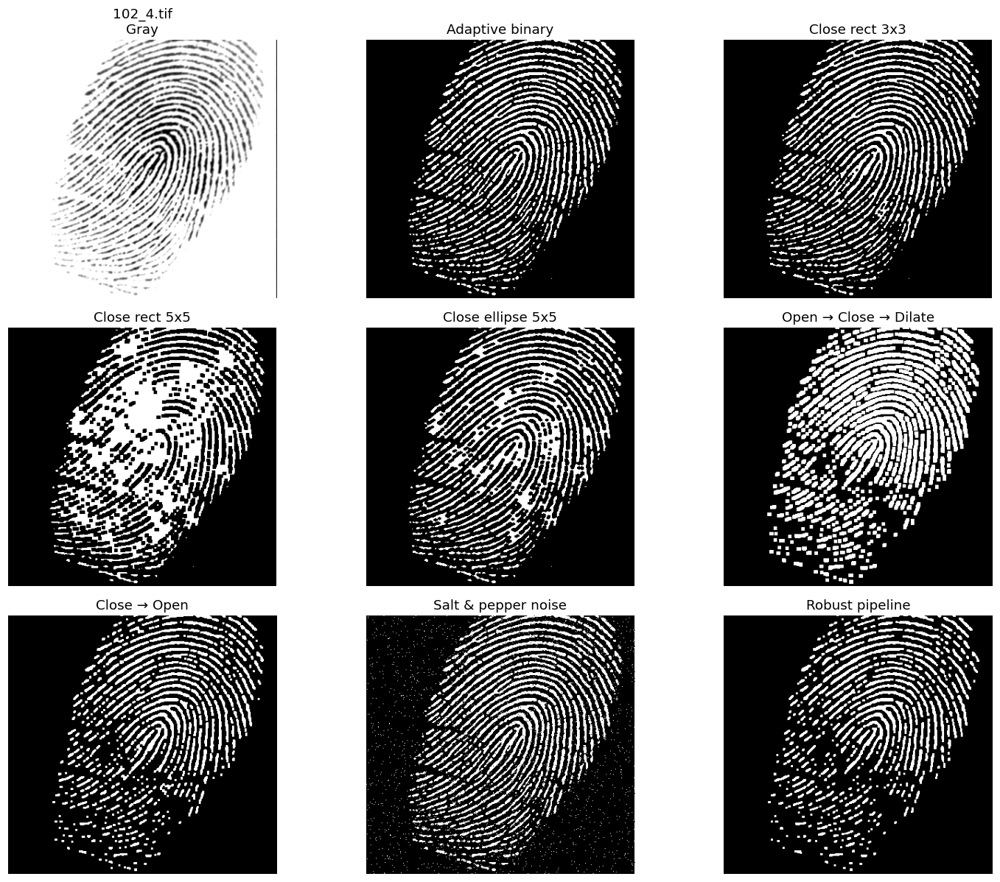

In [2]:
# Fingerprint morphology: preprocessing, cleaning, enhancement, and robustness

finger_files = ["101_8.tif", "102_4.tif"]

for fname in finger_files:
    gray = read_gray(fname)
    if gray is None:
        continue

    binary = binary_adaptive(gray, inv=True)
    k3_rect = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    k5_rect = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 5))
    k5_ellipse = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))

    open_then_close = cv2.morphologyEx(binary, cv2.MORPH_OPEN, k3_rect, iterations=1)
    open_then_close = cv2.morphologyEx(open_then_close, cv2.MORPH_CLOSE, k3_rect, iterations=1)
    open_then_close = cv2.dilate(open_then_close, k3_rect, iterations=1)

    close_then_open = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, k3_rect, iterations=1)
    close_then_open = cv2.morphologyEx(close_then_open, cv2.MORPH_OPEN, k3_rect, iterations=1)

    rect_3 = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, k3_rect, iterations=1)
    rect_5 = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, k5_rect, iterations=1)
    ellipse_5 = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, k5_ellipse, iterations=1)

    noisy = add_salt_pepper_noise(binary, amount=0.03)
    robust = cv2.medianBlur(noisy, 3)
    robust = cv2.morphologyEx(robust, cv2.MORPH_OPEN, k3_rect, iterations=1)
    robust = cv2.morphologyEx(robust, cv2.MORPH_CLOSE, k3_rect, iterations=1)

    show_grid(
        [gray, binary, rect_3, rect_5, ellipse_5, open_then_close, close_then_open, noisy, robust],
        titles=[
            f"{fname}\nGray", "Adaptive binary", "Close rect 3x3", "Close rect 5x5", "Close ellipse 5x5",
            "Open → Close → Dilate", "Close → Open", "Salt & pepper noise", "Robust pipeline"
        ],
        cols=3,
        figsize=(14, 11)
    )

**Add your analysis and comments here**

- A **3x3 kernel** preserves fine fingerprint ridges better, while a **5x5 kernel** smooths more aggressively and may merge nearby ridges.
- **Rectangular kernels** tend to preserve straight ridge continuity, whereas **elliptical kernels** produce slightly softer and more rounded repairs.
- Applying **opening before closing** removes isolated specks first and then reconnects broken ridges, so the final result is usually cleaner.
- Applying **closing before opening** may fill gaps early, but it can also keep unwanted blobs that opening cannot fully remove afterward.
> After adding salt-and-pepper noise, the most robust pipeline was: **median filtering + opening + closing**, because it removed dots while keeping the ridge pattern readable.

-------------------------------------------------------------------------------------------------------------------------------

# Manipulation 3: Shape Detection Using the Hough Transform


 #### **Introduction**

The *Hough Transform* is a feature extraction technique used in image analysis and computer vision to detect simple shapes, as like lines, circles, and ellipses. Instead of searching for lines directly in the image space, the *Hough Transform* maps image points into a parameter space where curves usually sinusoidal intersect at points representing the detected shapes. There two main types: *Standard Hough Transform (SHT)* which is used to detect lines, while *Hough Circle Transform* is for detecting circles.

The final result of the linear Hough transform is a two-dimensional array (matrix) similar to the accumulator-one dimension (to represent the Hough space) of this matrix is the quantized angle θ, and the other dimension is the quantized distance r. Each element of the matrix has a value equal to the sum of the points or pixels that are positioned on the line represented by quantized parameters (r,θ). So the element with the highest value indicates the straight line that is most represented in the input image.

![Sample Image](illustrations/Hough.png)

![Sample Image](illustrations/R_theta_line.gif)

**Detect straight lines in an image using the Hough Transform**

1-  Load and Convert the Image to Grayscale;

2-  Apply Canny Edge Detection, that finds the edges (binary image), which are required for Hough Transform;

3-  Apply the Hough Line Transform, using OpenCv Function `cv2.HoughLines`, which cab be represented as:

`lines = cv2.HoughLines(edges, rho=1, theta=np.pi/180, threshold=150)`, **Where:**

`rho`.Distance resolution in pixels (usually 1).

`theta`.Angular resolution in radians (np.pi/180 → 1°).

`threshold`. Minimum number of votes (intersections) to qualify as a line.

**Each result in lines is a pair (rho, theta).**

4- Draw the Lines on the Original Image;

5- Show the Result.

![Sample Image](illustrations/IlluHough.png)

**Let's explain the last illustration:**

- For each data point, several lines are drawn through it at different angles. These lines are shown in different colors;
- The Hough Transform adds up the contributions from all the edge pixels that have been detected. For every line, there is a special line called a "support line", which is always perpendicular to the original line and passes through the origin. In each case, one of these support lines is shown as an arrow;
- The Hough Transform then calculates the angle and the shortest distance from the origin to each support line. These values (angle and distance) are shown in a table under the diagrams.



#### **Use Cases and Applications**

- Lane detection in self-driving cars →	Detecting road lanes using line detection;
- Target detection → Identifying concentric shapes or circles in robotics/AR; 
- Medical imaging →	Detecting circular anomalies in X-rays or MRI images;
- Object boundary detection → Detecting the contour of cylindrical/rounded objects;
-  Document analysis → Detecting lines in tables, text regions, etc.


## **Task 1: Visualizing the Hough Line Transform with a Synthetic Image**

**Objective:**

To understand how the *Hough Line Transform* works by creating a controlled environment of the synthetic image and observing how edge detection and line parameterization interact.

#### **T1.1: Create Synthetic Images**

1- Start by creating a blank image (black canvas), and then draw simple geometric shapes on it like lines, rectangles, and circles. You are crafting a test environment where you know the features, so you can evaluate how well the Hough Transform detects them. Drawing lines at various angles helps you observe how their parameters (angle and distance from origin) map to Hough space. As follows:

![Sample Image](illustrations/Synth.png)


2- Apply the Canny Edge Detector. This will reduce the image to a binary form, highlighting only the most prominent edges those which will be considered for further processing in the Hough Transform.

3- Apply the Hough Line Transform.

4- Visualize the Results and the Accumulator Space (*OpenCV* doesn’t provide direct access to the accumulator, but we can simulate a visual representation using `skimage` as (`from skimage.transform import hough_line, hough_line_peaks`)



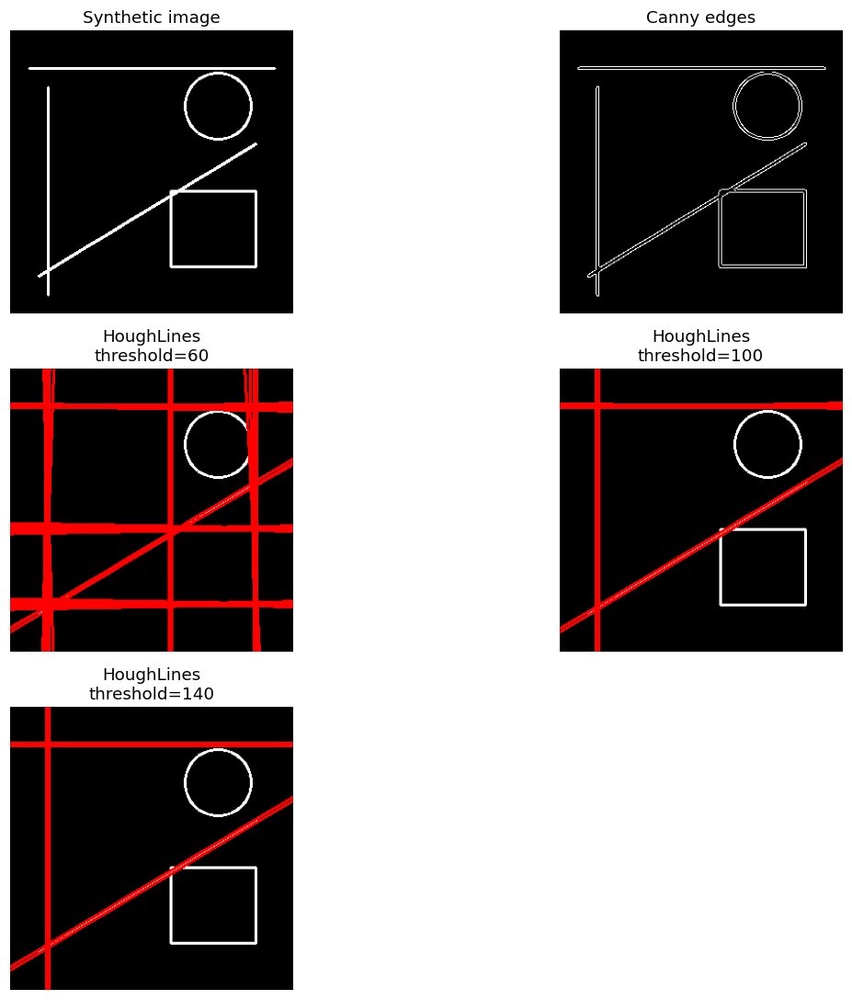

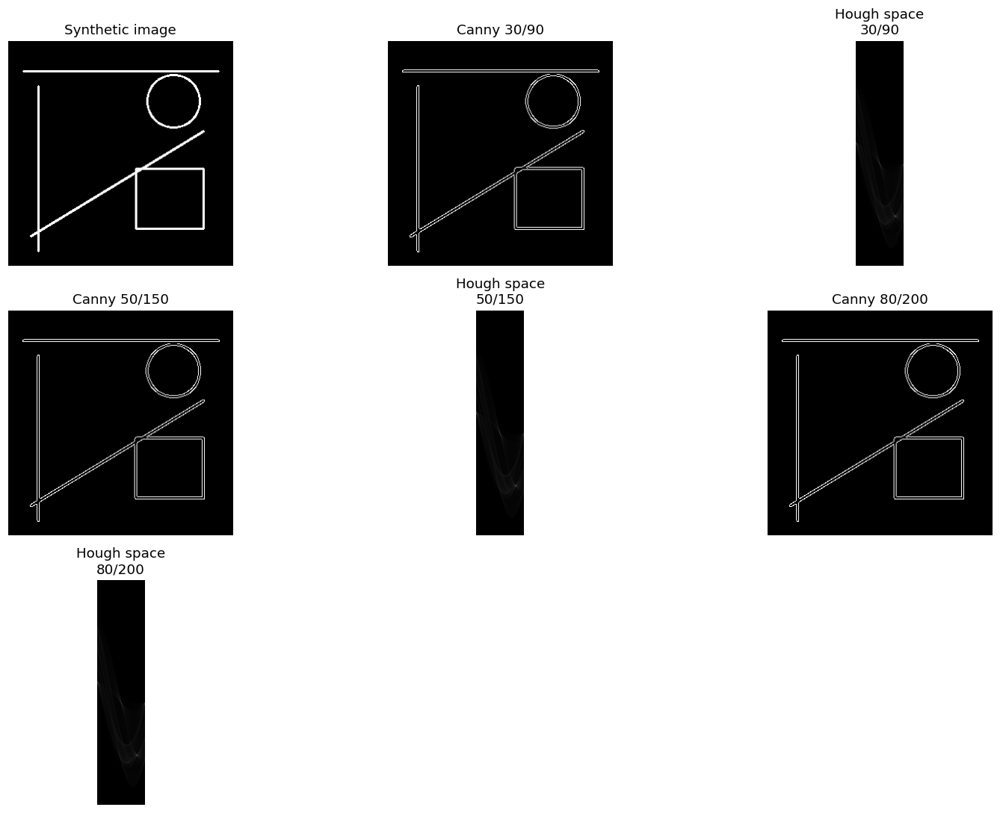

In [3]:
# T1.1 - Synthetic image, Canny, standard Hough lines, and Hough-space visualization

synth = np.zeros((300, 300), dtype=np.uint8)
cv2.line(synth, (20, 40), (280, 40), 255, 2)
cv2.line(synth, (30, 260), (260, 120), 255, 2)
cv2.line(synth, (40, 60), (40, 280), 255, 2)
cv2.rectangle(synth, (170, 170), (260, 250), 255, 2)
cv2.circle(synth, (220, 80), 35, 255, 2)

edges = cv2.Canny(synth, 50, 150)
line_thresholds = [60, 100, 140]
hough_outputs = []

for th in line_thresholds:
    lines = cv2.HoughLines(edges, 1, np.pi / 180, th)
    bgr = cv2.cvtColor(synth, cv2.COLOR_GRAY2BGR)
    hough_outputs.append(overlay_lines(bgr, lines, probabilistic=False))

show_grid(
    [synth, edges] + hough_outputs,
    titles=["Synthetic image", "Canny edges"] + [f"HoughLines\nthreshold={t}" for t in line_thresholds],
    cols=2,
    figsize=(12, 10)
)

if SKIMAGE_OK:
    tested = [(30, 90), (50, 150), (80, 200)]
    imgs = [synth]
    titles = ["Synthetic image"]
    for low, high in tested:
        e = cv2.Canny(synth, low, high)
        hspace, angles, dists = hough_line(e)
        imgs.extend([e, hspace])
        titles.extend([f"Canny {low}/{high}", f"Hough space\n{low}/{high}"])
    show_grid(imgs, titles=titles, cols=3, figsize=(14, 10), cmap='gray')
else:
    print("scikit-image is not available, so accumulator visualization was skipped.")

#### **T1.2: Reflect and Analyze**


1- How does changing the threshold in cv2.HoughLines() affect the result?

2- What happens if you apply Canny with different threshold values?

3- Which shapes were successfully detected? Why were circles ignored in the line transform?

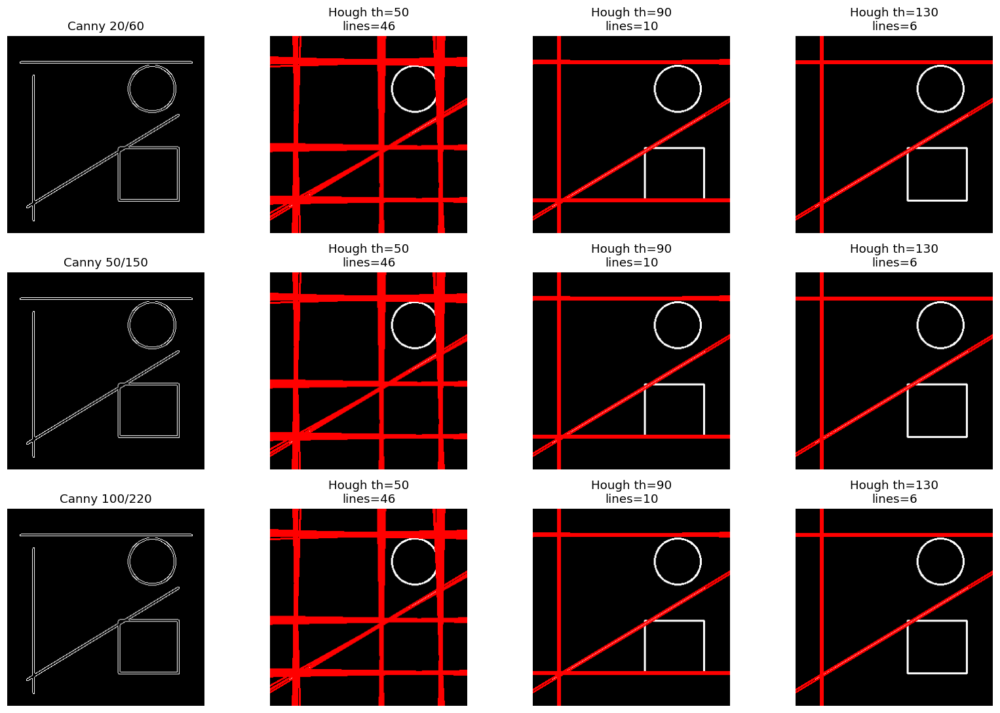

In [4]:
# T1.2 - Reflection by varying Hough and Canny thresholds

canny_settings = [(20, 60), (50, 150), (100, 220)]
hough_ths = [50, 90, 130]

images = []
titles = []
for low, high in canny_settings:
    e = cv2.Canny(synth, low, high)
    images.append(e)
    titles.append(f"Canny {low}/{high}")
    for ht in hough_ths:
        lines = cv2.HoughLines(e, 1, np.pi / 180, ht)
        overlay = overlay_lines(cv2.cvtColor(synth, cv2.COLOR_GRAY2BGR), lines, probabilistic=False)
        images.append(overlay)
        count = 0 if lines is None else len(lines)
        titles.append(f"Hough th={ht}\nlines={count}")

show_grid(images, titles=titles, cols=4, figsize=(15, 10))

**Add your analysis and comments here**

- Increasing the threshold in `cv2.HoughLines()` makes the detector more selective, so fewer but stronger lines are returned.
- Lower Canny thresholds detect more edge pixels, which can help recover weak lines but may also introduce noisy or duplicate detections.
- The straight **lines and rectangle edges** are detected successfully because they map well into Hough line parameter space.
> The circle is ignored by the line transform because its boundary is curved, not represented by one dominant `(rho, theta)` pair.

#### **T1.3: Comparing Standard and Probabilistic Hough Transform**

**Objective:** 

To understand the differences between the standard and probabilistic Hough Line Transforms by applying both to the same synthetic and real images, and reflecting on the results and performance.

 ## **What to do?**

 **PartI**: Search of concepts:

1- Investigate the two OpenCV functions: `cv2.HoughLines()` Standard Hough Transform, and `cv2.HoughLinesP()` Probabilistic Hough Transform.

2- What are the differences in their input parameters?

3- What kind of outputs do they produce?

4- Which one is better suited for performance-sensitive or noisy environments?

**PartII**: Using the synthetic image: 

1- Apply Standard Hough Transform `(cv2.HoughLines)`.

2- Apply Probabilistic Hough Transform `(cv2.HoughLinesP)`.

3- Display the results side by side and observe:

 * Which lines were detected in each case?

 * Are there any differences in accuracy?

 * Are lines longer, shorter, or more fragmented in either method?

 * Add Noise to the images. What do you notice after applying the hough transform? 



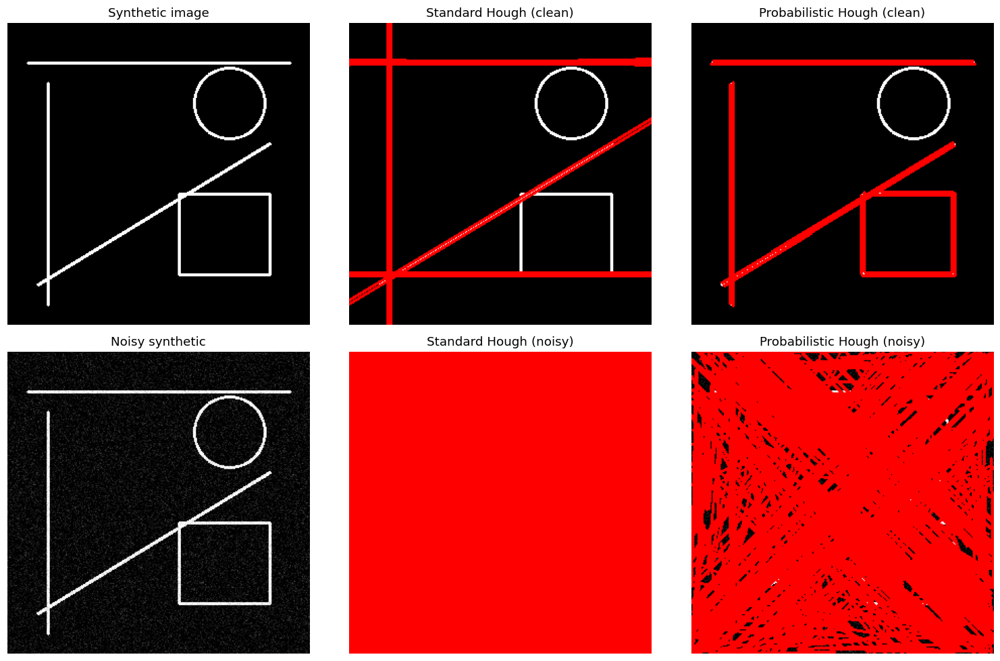

Standard clean lines: 10
Probabilistic clean segments: 16
Standard noisy lines: 6714
Probabilistic noisy segments: 435


In [5]:
# T1.3 - Compare standard and probabilistic Hough on clean and noisy synthetic images

noisy_synth = add_gaussian_noise(synth, sigma=25)
clean_edges = cv2.Canny(synth, 50, 150)
noisy_edges = cv2.Canny(noisy_synth, 50, 150)

std_clean = cv2.HoughLines(clean_edges, 1, np.pi/180, 90)
std_noisy = cv2.HoughLines(noisy_edges, 1, np.pi/180, 90)

prob_clean = cv2.HoughLinesP(clean_edges, 1, np.pi/180, 40, minLineLength=40, maxLineGap=10)
prob_noisy = cv2.HoughLinesP(noisy_edges, 1, np.pi/180, 40, minLineLength=30, maxLineGap=12)

show_grid(
    [
        synth,
        overlay_lines(cv2.cvtColor(synth, cv2.COLOR_GRAY2BGR), std_clean, probabilistic=False),
        overlay_lines(cv2.cvtColor(synth, cv2.COLOR_GRAY2BGR), prob_clean, probabilistic=True),
        noisy_synth,
        overlay_lines(cv2.cvtColor(noisy_synth, cv2.COLOR_GRAY2BGR), std_noisy, probabilistic=False),
        overlay_lines(cv2.cvtColor(noisy_synth, cv2.COLOR_GRAY2BGR), prob_noisy, probabilistic=True),
    ],
    titles=[
        "Synthetic image", "Standard Hough (clean)", "Probabilistic Hough (clean)",
        "Noisy synthetic", "Standard Hough (noisy)", "Probabilistic Hough (noisy)"
    ],
    cols=3,
    figsize=(14, 9)
)

print("Standard clean lines:", 0 if std_clean is None else len(std_clean))
print("Probabilistic clean segments:", 0 if prob_clean is None else len(prob_clean))
print("Standard noisy lines:", 0 if std_noisy is None else len(std_noisy))
print("Probabilistic noisy segments:", 0 if prob_noisy is None else len(prob_noisy))

**Add your analysis and comments here**

| Aspect | `cv2.HoughLines()` | `cv2.HoughLinesP()` |
|---|---|---|
| Output | Infinite lines in `(rho, theta)` form | Finite line segments `(x1, y1, x2, y2)` |
| Parameters | Mainly `rho`, `theta`, `threshold` | Adds `minLineLength` and `maxLineGap` |
| Speed | Heavier accumulator-based search | Usually faster and more practical |
| Noise behavior | Can return many redundant lines | Often gives shorter but more useful segments |

- On the synthetic image, the standard transform detects the dominant global lines, while the probabilistic version returns line segments that are easier to interpret visually.
- After adding noise, both methods degrade, but the probabilistic one is often easier to tune because short noisy segments can be filtered using `minLineLength`.
> For performance-sensitive or noisy scenes, **HoughLinesP** is usually the better practical choice.

## **Task 2: Circle Detection**

Hough Circle Transform Function in OpenCV: `cv2.HoughCircles(image, method, dp, minDist, param1, param2, minRadius, maxRadius)`. **Where:**


`image`: The input grayscale image (usually blurred).

`method`: The detection method. Always use `cv2.HOUGH_GRADIENT`.

`dp`: Inverse ratio of the accumulator resolution to the image resolution.

Example: dp=1 → same size; dp=2 → accumulator is half-size.

`minDist`: Minimum distance between the centers of detected circles.

`param1`: First method-specific parameter. In HOUGH_GRADIENT, it’s the higher threshold for Canny edge detection.

`param2`: Second method-specific parameter. It’s the threshold for center detection. Lower values may detect more circles (with false positives).

`minRadius`: Minimum circle radius to detect.

`maxRadius`: Maximum circle radius to detect.

#### **T2.1: Create a Synthetic Image with Circles**
Begin by creating a blank black image and drawing several white circles of various radius and positions. You may even add non-circular shapes (like squares or lines) to challenge the circle detector. This will give you a clear environment to observe what the Hough Circle Transform can and/or can’t detect. As follows:

![Sample Image](illustrations/Syth.png)

## **What to do?**

1- Create the Synthetic Image.

2- Preprocessing: Before applying the Hough Circle Transform, apply a Gaussian blur. This step is essential because circle detection is sensitive to noise and edges, and blurring helps improve the robustness of the algorithm.

3- Visualize the Detected Circles.

4- **Reflection questions**: Did it detect the correct number of circles? Were the sizes and centers correct? Did it mistakenly detect non-circular shapes as circles?



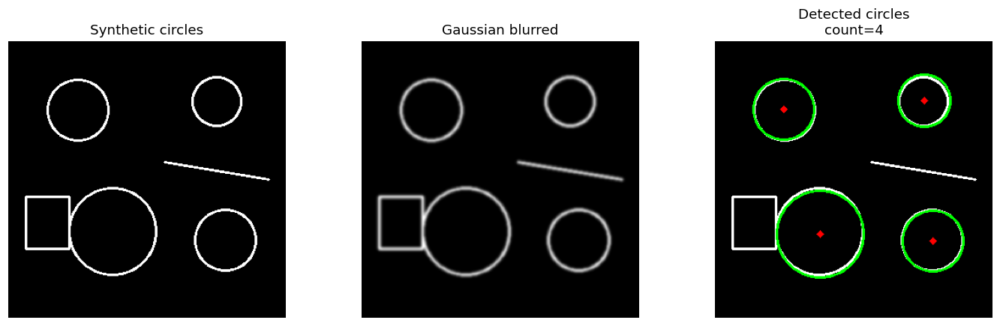

In [17]:
# Task 2 - Synthetic circle detection

circ = np.zeros((320, 320), dtype=np.uint8)
for center, r in [((80, 80), 35), ((240, 70), 28), ((120, 220), 50), ((250, 230), 35)]:
    cv2.circle(circ, center, r, 255, 2)

cv2.rectangle(circ, (20, 180), (70, 240), 255, 2)
cv2.line(circ, (180, 140), (300, 160), 255, 2)

# Blur to smooth edges a bit before HoughCircles
blur = cv2.GaussianBlur(circ, (9, 9), 1.5)

# Stricter parameters to reduce false positives
circles = cv2.HoughCircles(
    blur,
    cv2.HOUGH_GRADIENT,
    dp=1.2,
    minDist=60,
    param1=120,
    param2=30,
    minRadius=20,
    maxRadius=55
)

detected = draw_circles(cv2.cvtColor(circ, cv2.COLOR_GRAY2BGR), circles)

show_grid(
    [circ, blur, detected],
    titles=[
        "Synthetic circles",
        "Gaussian blurred",
        f"Detected circles\ncount={0 if circles is None else circles.shape[1]}"
    ],
    cols=3,
    figsize=(13, 4)
)

**Add your analysis and comments here**

- The detector should recover most real circles when the blur and `param2` values are chosen reasonably.
- Circle centers and radii are usually close to the true values, but weak or partially broken circles can be missed.
- Non-circular shapes such as rectangles and lines are generally ignored because the voting scheme is specialized for circular geometry.
> Lower `param2` detects more circles, but it also increases the chance of false positives.

## **Task 3: Work on Real Images**

#### **T3.1: Road Lane Detection Using the Hough Line Transform**

Road lane detection is one of the core tasks in autonomous driving systems. The aim is to extract lane boundaries from a driving scene using edge detection and the Hough Line Transform. This task simulates real-world autonomous vehicle preprocessing.

**What to do?**

1- Preprocessing Phase: Convert the road image to `grayscale` and apply `Gaussian blur`. Images: `(Road1; Road2; Road3)`.

2- Use `Canny edge detection` to identify lane edges.

3- Apply the `standard Hough Line Transform` to detect straight lines.

4- Overlay the detected lanes on the original image.

5- Add Gaussian noise to the image and observe its impact on edge detection and Hough lines. Try different noise levels and plot the number of detected lines.

6- Experiment with different values of `threshold, rho, and theta in cv2.HoughLines()`.


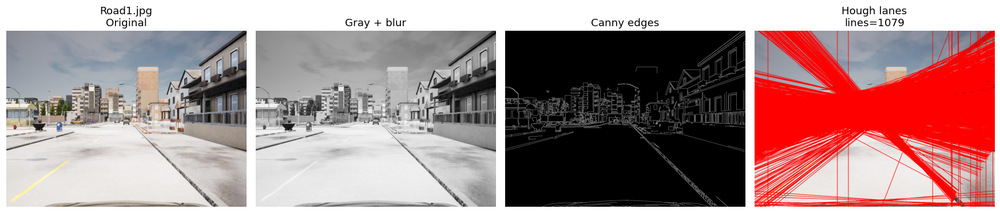

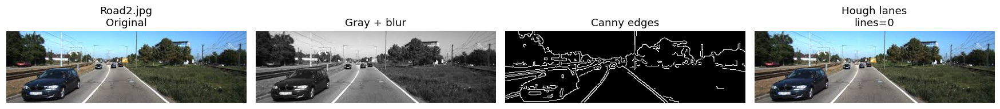

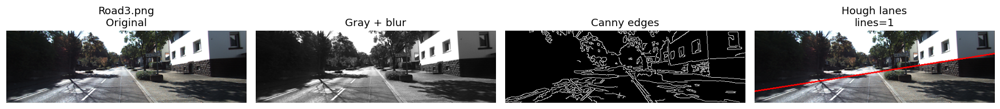

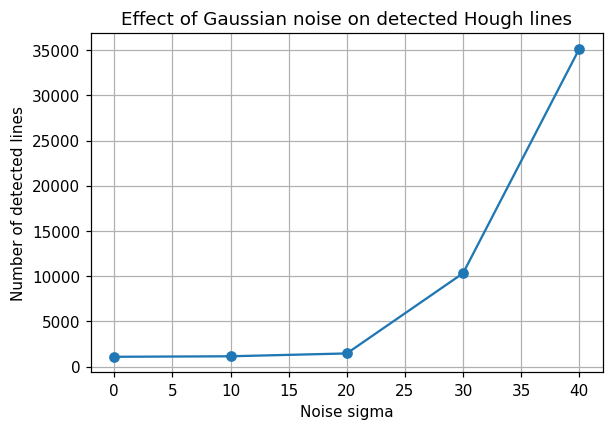

In [12]:
# T3.1 - Road lane detection, overlay, and noise experiment

road_files = ["Road1.jpg", "Road2.jpg", "Road3.png"]

def detect_hough_lines_on_road(img_bgr, hough_threshold=130, rho=1, theta=np.pi/180):
    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (5, 5), 0)
    edges = cv2.Canny(blur, 50, 150)
    lines = cv2.HoughLines(edges, rho, theta, hough_threshold)
    overlay = overlay_lines(img_bgr, lines, probabilistic=False)
    return gray, blur, edges, overlay, 0 if lines is None else len(lines)

for fname in road_files:
    img = read_bgr(fname)
    if img is None:
        continue
    gray, blur, edges, overlay, count = detect_hough_lines_on_road(img)
    show_grid(
        [img, gray, edges, overlay],
        titles=[f"{fname}\nOriginal", "Gray + blur", "Canny edges", f"Hough lanes\nlines={count}"],
        cols=4,
        figsize=(16, 4)
    )

img = read_bgr("Road1.jpg")
if img is not None:
    sigmas = [0, 10, 20, 30, 40]
    counts = []
    for s in sigmas:
        noisy = img if s == 0 else cv2.cvtColor(add_gaussian_noise(cv2.cvtColor(img, cv2.COLOR_BGR2GRAY), sigma=s), cv2.COLOR_GRAY2BGR)
        _, _, _, _, n = detect_hough_lines_on_road(noisy)
        counts.append(n)
    plt.figure(figsize=(6, 4))
    plt.plot(sigmas, counts, marker='o')
    plt.title("Effect of Gaussian noise on detected Hough lines")
    plt.xlabel("Noise sigma")
    plt.ylabel("Number of detected lines")
    plt.grid(True)
    plt.show()

**Add your analysis and comments here**

- Lane detection works best after **grayscale conversion + Gaussian blur + Canny**, because this suppresses texture and keeps the strongest road boundaries.
- Changing `threshold`, `rho`, and `theta` in `cv2.HoughLines()` affects how many lane candidates are returned and how stable the result is.
- After adding Gaussian noise, the edge map becomes more cluttered and the number of detected lines changes noticeably.
> Stronger noise causes false line detections and weak lane markings may disappear, so preprocessing becomes much more important.

#### **T3.2: Circle Detection in Medical Imaging**

In medical image analysis, detecting circular shapes like cells, tumors, or abnormalities (e.g., aneurysms) can provide insights into the biological structure. Hough Circle Transform helps in localizing such features.

**What to do?**

1- Preprocessing Phase: Convert the road image to `grayscale` and apply `Gaussian blur`. Images: `(Cell1; Cell2; Brain; Lung; Blobs)`.

2- Use cv2.HoughCircles() to detect circular structures.

3- Display the results.

4- *Parameter Effects*: Vary dp, minDist, param1, param2, minRadius, and maxRadius.

5- *Noise Experiment*: Add `salt & pepper or Gaussian noise`. Apply median filtering before detection and compare results with/without filtering.


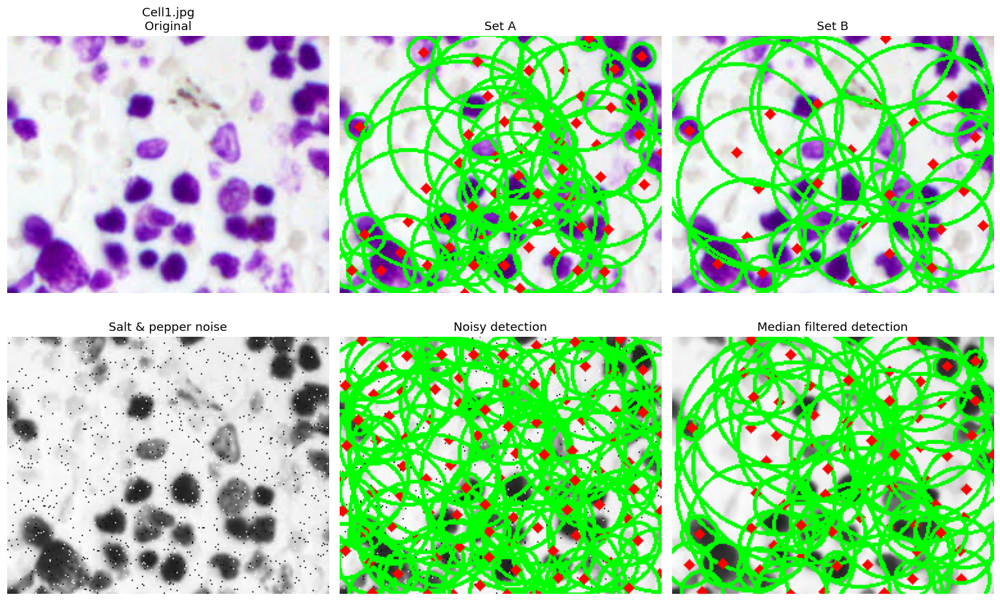

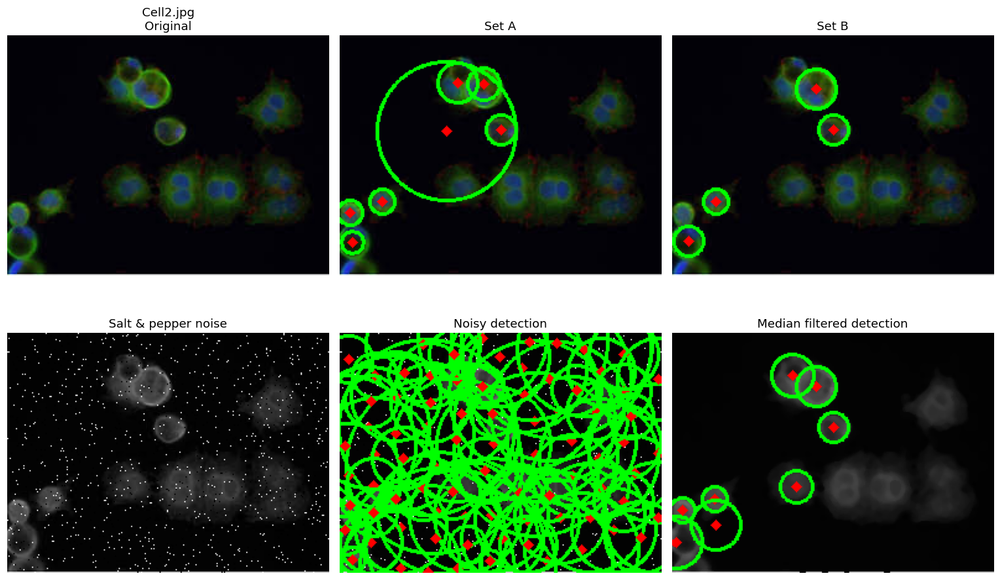

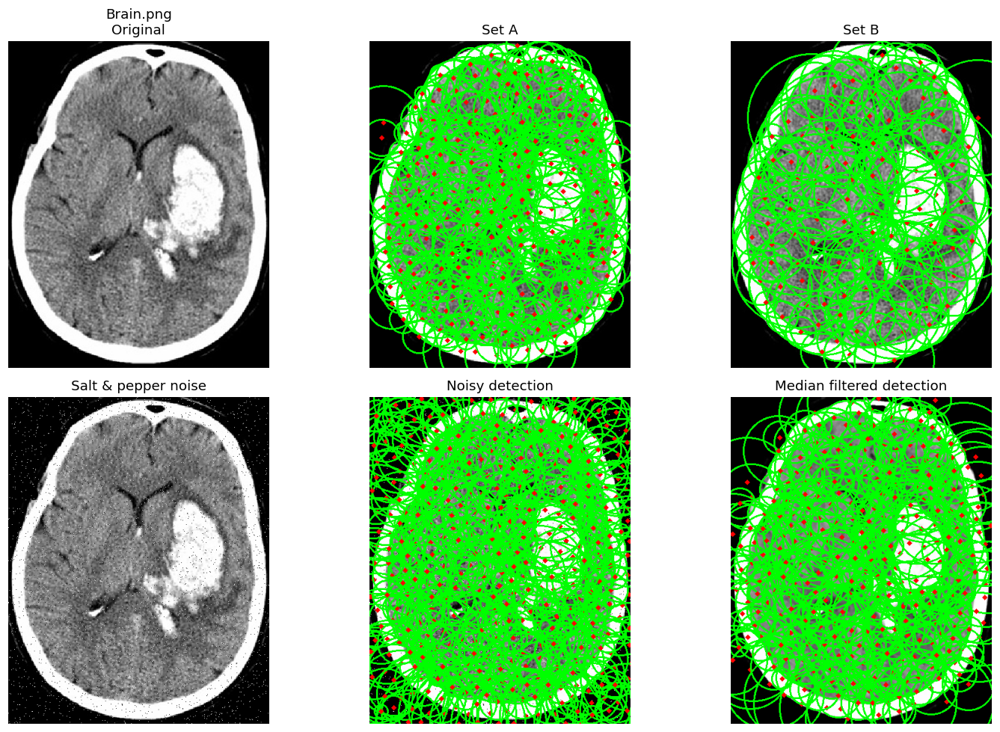

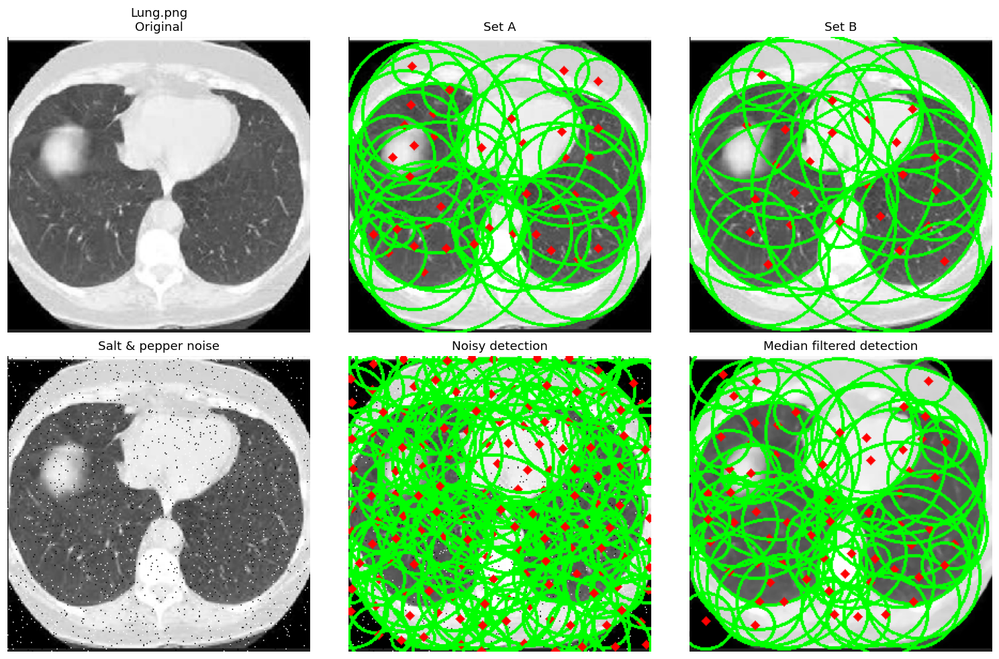

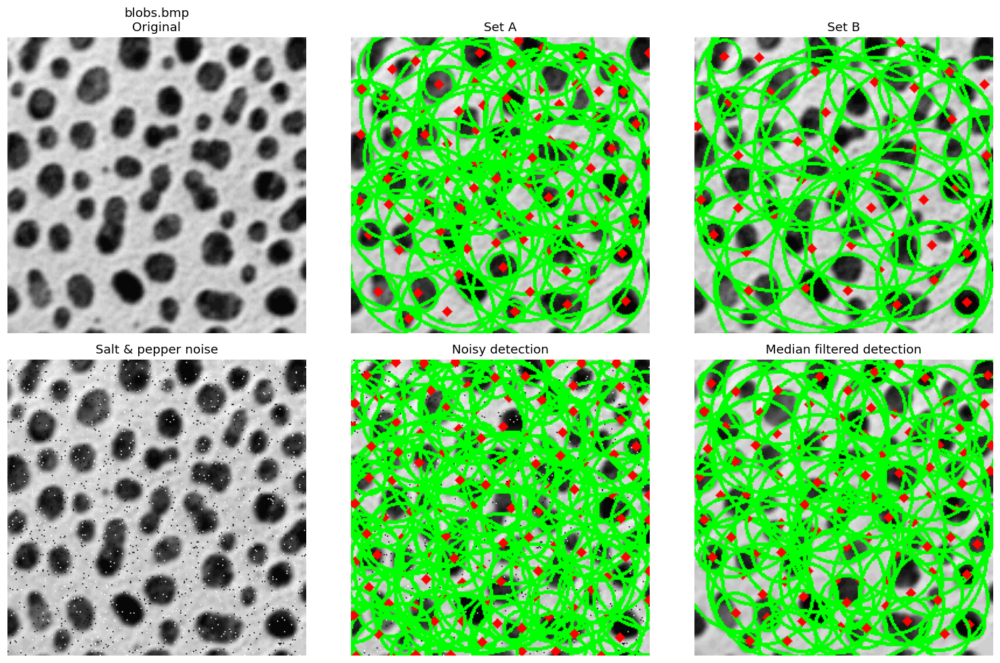

In [13]:
# T3.2 - Circle detection in medical imaging with parameter and noise effects

medical_files = ["Cell1.jpg", "Cell2.jpg", "Brain.png", "Lung.png", "blobs.bmp"]

for fname in medical_files:
    img = read_bgr(fname)
    if img is None:
        continue
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (9, 9), 1.5)
    circles_a = cv2.HoughCircles(blur, cv2.HOUGH_GRADIENT, dp=1.2, minDist=20,
                                 param1=100, param2=18, minRadius=5, maxRadius=80)
    circles_b = cv2.HoughCircles(blur, cv2.HOUGH_GRADIENT, dp=1.5, minDist=30,
                                 param1=120, param2=28, minRadius=8, maxRadius=120)

    noisy = add_salt_pepper_noise(gray, amount=0.03)
    median = cv2.medianBlur(noisy, 5)
    circles_noisy = cv2.HoughCircles(noisy, cv2.HOUGH_GRADIENT, dp=1.2, minDist=20,
                                     param1=100, param2=18, minRadius=5, maxRadius=80)
    circles_med = cv2.HoughCircles(median, cv2.HOUGH_GRADIENT, dp=1.2, minDist=20,
                                   param1=100, param2=18, minRadius=5, maxRadius=80)

    show_grid(
        [
            img,
            draw_circles(img.copy(), circles_a),
            draw_circles(img.copy(), circles_b),
            cv2.cvtColor(noisy, cv2.COLOR_GRAY2BGR),
            draw_circles(cv2.cvtColor(noisy, cv2.COLOR_GRAY2BGR), circles_noisy),
            draw_circles(cv2.cvtColor(median, cv2.COLOR_GRAY2BGR), circles_med),
        ],
        titles=[
            f"{fname}\nOriginal", "Set A", "Set B",
            "Salt & pepper noise", "Noisy detection", "Median filtered detection"
        ],
        cols=3,
        figsize=(14, 9)
    )

**Add your analysis and comments here**

- The Hough circle detector can localize rounded structures in medical images, but it is sensitive to blur level and the parameter set.
- Increasing `dp` and `minDist` changes how many circles can be separated, while `param1` and `param2` control edge sensitivity and center acceptance.
- After adding salt-and-pepper noise, many false detections appear or true circles are missed.
> Applying **median filtering before detection** usually improves robustness because it removes impulse noise without destroying circular boundaries too much.

#### **T3.3: Line Detection and Image Alignment**

Circuit board inspection often requires identifying straight lines that represent traces or wires. Aligning such an image ensures easier automated analysis and defect detection.


**What to do?**

**1- Preprocessing Phase:**

- Convert the image (`circuit.png`) to **grayscale**.
- Apply **Gaussian blur** to reduce noise.
- Use **Canny edge detection** to detect edges.

**2- Line Detection with Hough Transform:**

- Apply the **Hough Transform** to detect prominent lines in the edge image.
- Visualize the detected lines on a copy of the original image.

**3- Image Alignment (Deskewing):**

- Estimate the **angle of rotation** based on the dominant orientations of detected lines.
- Rotate the image to correct its orientation using one of the following methods:

  - **Method A**: Use an affine transformation to rotate the image (e.g., via a rotation matrix and warping).
  - **Method B**: Use `imutils.rotate_bound()` for rotation with automatic bounding-box adjustment (avoids cropping and simplifies rotation).

> *Note: Method B requires the `imutils` library (`pip install imutils`).*


**4- Display Results:**

- Show the **original image**, **edge-detected image**, **image with lines**, and the **aligned image**.

Estimated dominant angle: -33.97 degrees


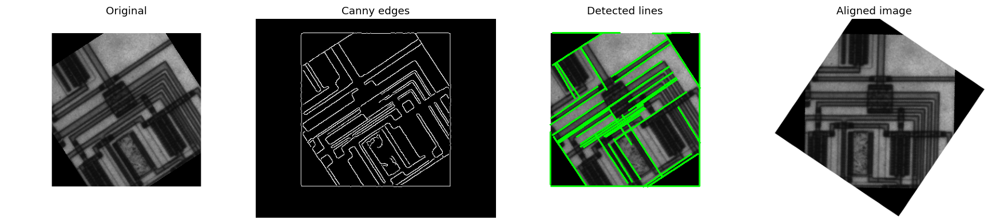

In [14]:
# T3.3 - Line detection and image alignment on the circuit image

img = read_bgr("circuit.png")
if img is not None:
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (5, 5), 0)
    edges = cv2.Canny(blur, 50, 150)

    lines_p = cv2.HoughLinesP(edges, 1, np.pi/180, 80, minLineLength=60, maxLineGap=10)
    lines_vis = overlay_lines(img, lines_p, probabilistic=True, color=(0, 255, 0), thickness=2)

    angles = []
    if lines_p is not None:
        for line in lines_p[:, 0]:
            x1, y1, x2, y2 = line
            ang = np.degrees(np.arctan2(y2 - y1, x2 - x1))
            if abs(ang) <= 45:
                angles.append(ang)
    dominant_angle = float(np.median(angles)) if angles else 0.0

    h, w = img.shape[:2]
    M = cv2.getRotationMatrix2D((w / 2, h / 2), dominant_angle, 1.0)
    aligned = cv2.warpAffine(img, M, (w, h), flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_REPLICATE)

    print(f"Estimated dominant angle: {dominant_angle:.2f} degrees")
    show_grid(
        [img, edges, lines_vis, aligned],
        titles=["Original", "Canny edges", "Detected lines", "Aligned image"],
        cols=4,
        figsize=(16, 4)
    )

**Add your analysis and comments here**

- The Hough transform successfully detects the dominant straight traces in the circuit image, which makes it possible to estimate the board orientation.
- Using the dominant line angles gives a simple deskewing strategy for alignment.
- After rotation, the main traces become more horizontal or vertical, which should help later inspection tasks.
> If the image contains many short noisy segments, probabilistic Hough is usually easier to control than the standard version.

#### **T3.4: Table Structure Extraction**

Automated document processing requires extracting structural elements such as tables, forms, and grids. This task explores using line detection to isolate rows and columns from scanned documents.

**What to do?**

1- Preprocess the images: `Doc1; Doc2; Doc3; Doc4; Sudoku1; Sudoku1`.

2- Apply Canny edge detection.

3- Use cv2.HoughLinesP() to extract both vertical and horizontal lines.

4- Combine line detection results to form a mask of the table.

5- *HoughLines vs. HoughLinesP*: Apply both on the same image. Compare detected line segments: number, accuracy, and completeness.

6- *Noise Handling:* Introduce scanning noise, and Apply morphological operations. **How it will effect the Hough Transform?**.

1- *Simulate Scanning Noise:*

- Add blur using something like `cv2.GaussianBlur() or cv2.blur()`.

- Add random specks/noise to mimic dust or paper texture (Salt & Paper).

- Optionally distort parts of the image to simulate low scan quality.

2- *Apply Morphological Operations:*

- Closing `(cv2.morphologyEx(image, cv2.MORPH_CLOSE, kernel))`: This fills small gaps in horizontal/vertical lines.

- Dilation: Makes thin lines thicker, helping the Hough Transform catch incomplete lines.

- Optionally test Erosion to reduce noise, or Opening to clean small dots without affecting large structures.

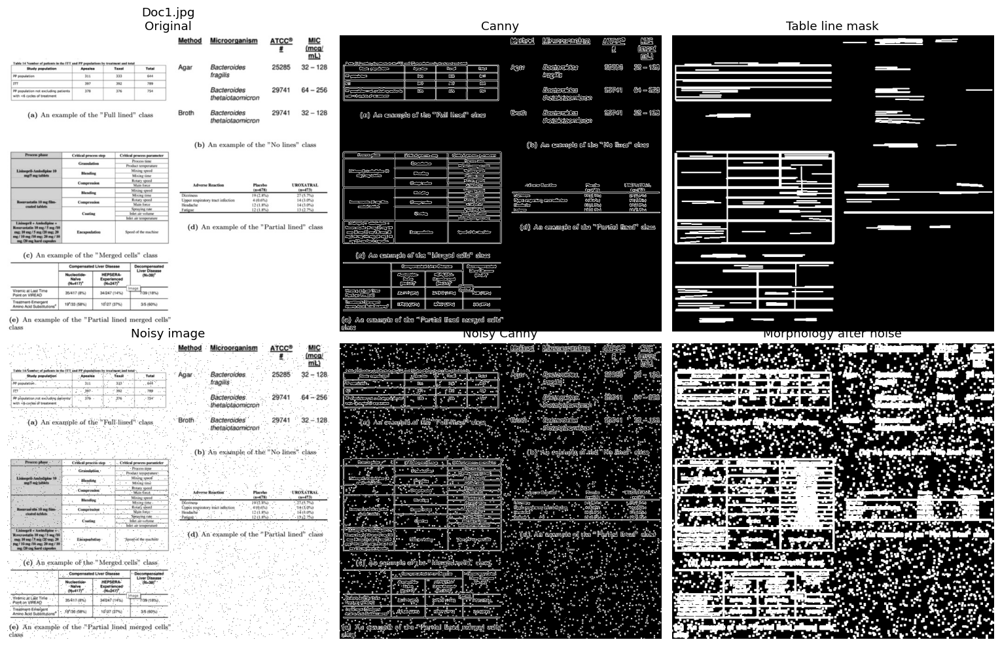

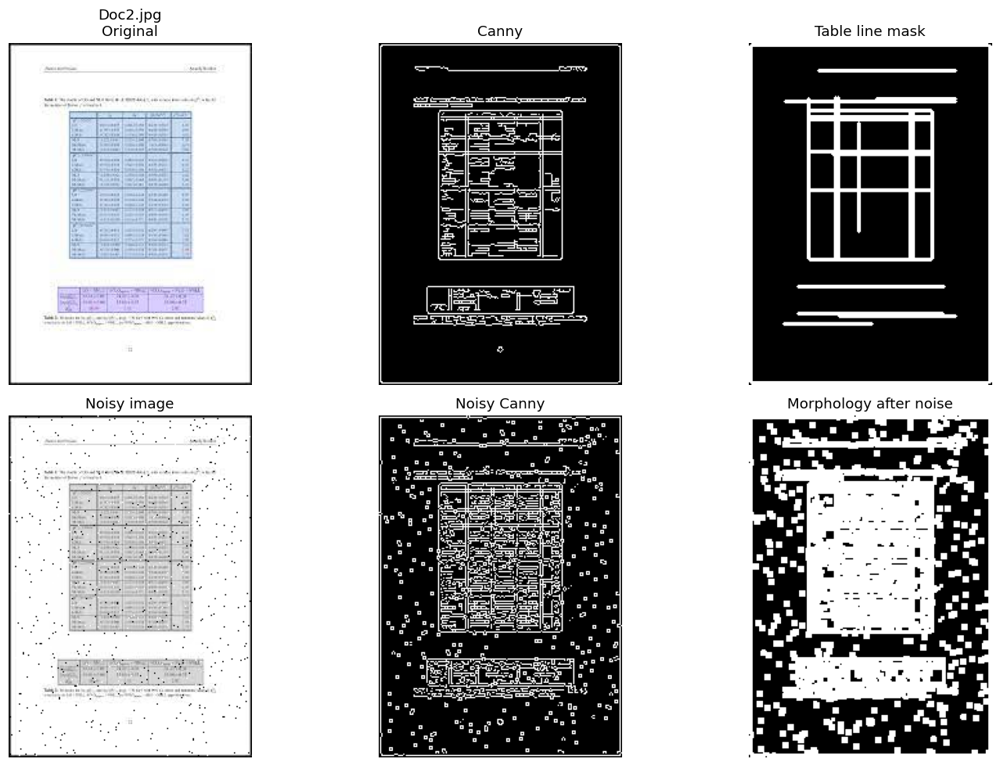

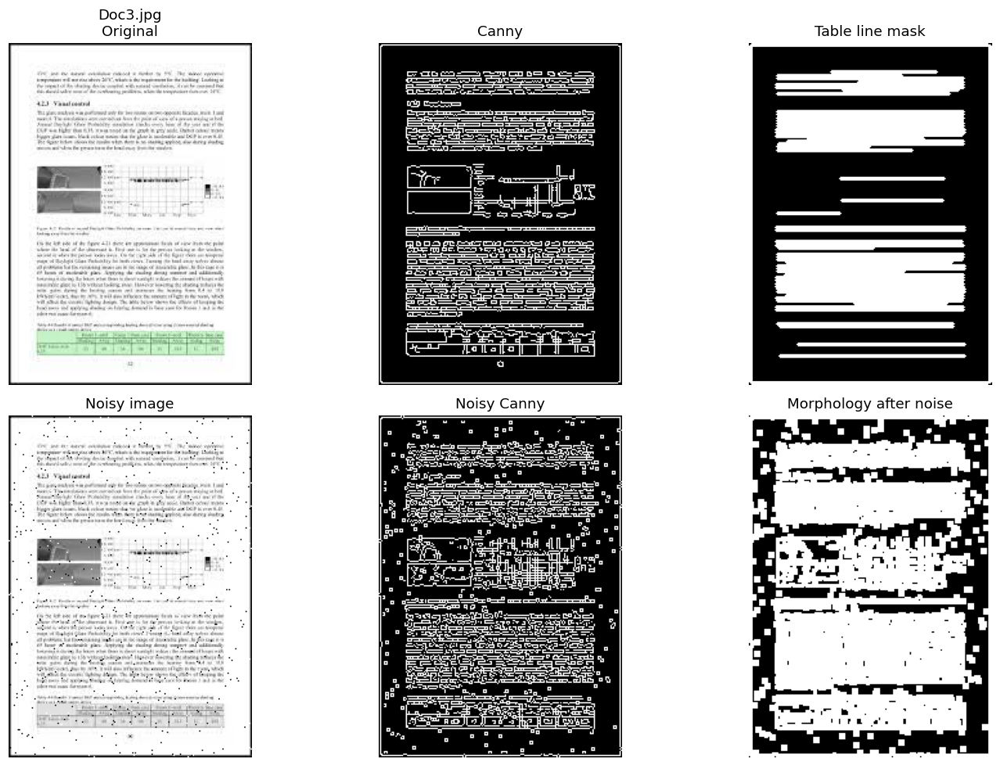

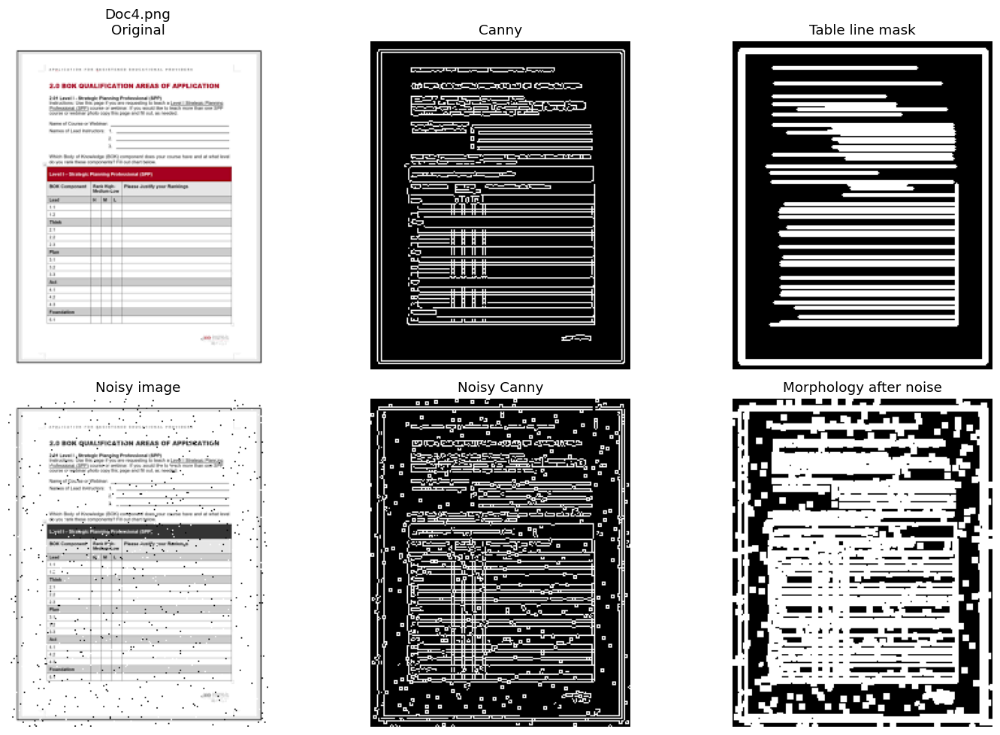

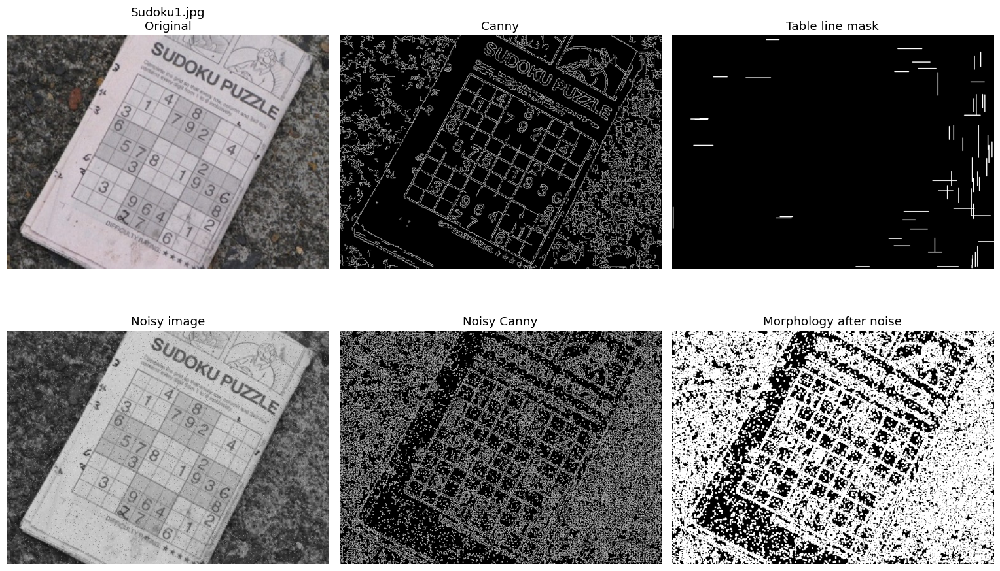

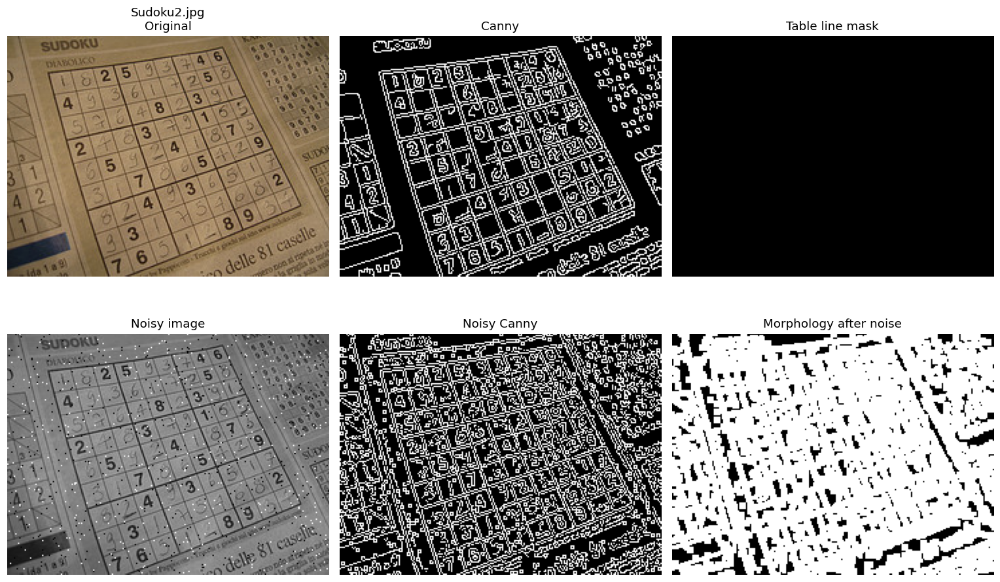

In [15]:
# T3.4 - Table structure extraction from document-like images

doc_files = ["Doc1.jpg", "Doc2.jpg", "Doc3.jpg", "Doc4.png", "Sudoku1.jpg", "Sudoku2.jpg"]

for fname in doc_files:
    img = read_bgr(fname)
    if img is None:
        continue
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (3, 3), 0)
    edges = cv2.Canny(blur, 50, 150)

    lines_p = cv2.HoughLinesP(edges, 1, np.pi/180, 70, minLineLength=40, maxLineGap=5)
    line_mask = np.zeros_like(gray)

    if lines_p is not None:
        for line in lines_p[:, 0]:
            x1, y1, x2, y2 = line
            if abs(x2 - x1) < 6 or abs(y2 - y1) < 6:
                cv2.line(line_mask, (x1, y1), (x2, y2), 255, 2)

    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    speckled = add_salt_pepper_noise(gray, amount=0.02)
    speckled_edges = cv2.Canny(speckled, 50, 150)
    closed = cv2.morphologyEx(speckled_edges, cv2.MORPH_CLOSE, kernel, iterations=1)
    dilated = cv2.dilate(closed, kernel, iterations=1)

    show_grid(
        [img, edges, line_mask, speckled, speckled_edges, dilated],
        titles=[f"{fname}\nOriginal", "Canny", "Table line mask", "Noisy image", "Noisy Canny", "Morphology after noise"],
        cols=3,
        figsize=(14, 9)
    )

**Add your analysis and comments here**

| Observation | Result |
|---|---|
| `HoughLinesP()` | Better for extracting finite table segments such as rows and columns |
| Standard Hough | Finds global lines, but can be harder to convert into a practical table mask |
| Noise addition | Breaks thin lines and introduces false edges |
| Morphological closing/dilation | Reconnects interrupted lines and makes the table structure easier to recover |

- For scanned documents, morphology is very useful before or after Hough detection because tables often contain gaps or weak strokes.
> The main trade-off is that too much dilation can merge nearby cells and reduce structural precision.

-------------------------------------------------------------------------------------------------------------------------------


# Manipulation 4: Edge Post-Processing and Quality Evaluation (Reflection and Analyzing)

**Objective:**
Enhance the detected edges and assess the quality of the edge detection process, from students' perspectives.

### **What to do?**

1- Post-Processing with Morphological Operations:

- Apply additional morphological operations (e.g., closing) on the edge-detected image to smooth and refine the results.
- Compare the post-processed edges to the original ones in terms of clarity.

2- Edge Contrast Adjustment:

- Adjust the contrast of the edge-detected image to improve visibility.
- Analyze how contrast adjustment affects the edge detection accuracy.

3- Edge Quality Evaluation:

- Evaluate the quality of edges using the presented metrics.
- Use visual assessment as well as edge quality metrics to quantify the improvements.

4- General Insights and student's perspectives:

- Which edge detector was most effective in which scenario and why?
- How morphology helped improve edge clarity.
- What shapes were successfully detected and what failed?



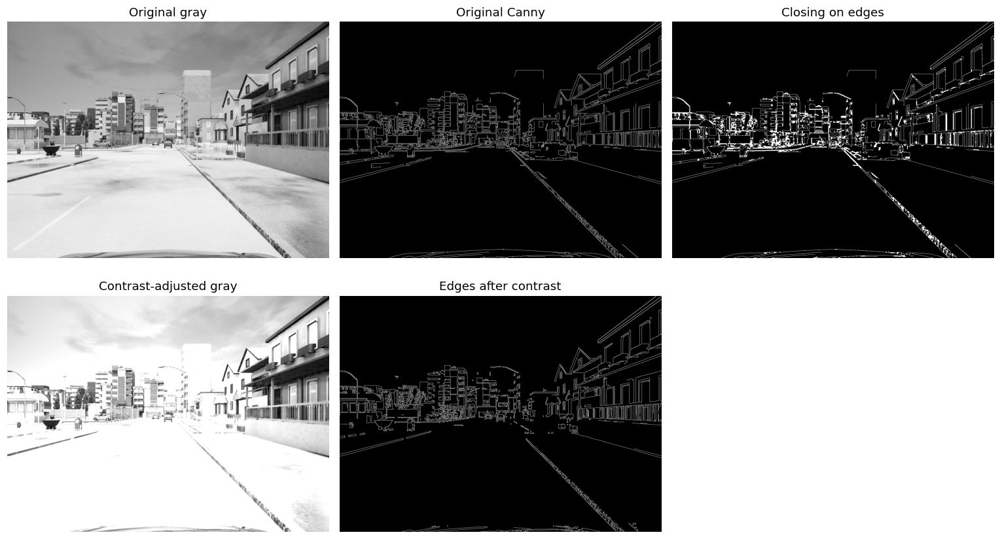

Simple edge quality metrics
Original Canny: {'edge_pixels': 50613, 'num_components': 550, 'avg_component_size': 92.02}
After closing: {'edge_pixels': 73079, 'num_components': 55, 'avg_component_size': 1328.71}
After contrast adjustment: {'edge_pixels': 46855, 'num_components': 542, 'avg_component_size': 86.45}


In [16]:
# Manipulation 4 - Edge post-processing and simple quality evaluation

img = read_bgr("Road1.jpg")
if img is not None:
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    base_edges = cv2.Canny(cv2.GaussianBlur(gray, (5, 5), 0), 50, 150)

    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    closed_edges = cv2.morphologyEx(base_edges, cv2.MORPH_CLOSE, kernel, iterations=1)

    enhanced_gray = cv2.convertScaleAbs(gray, alpha=1.4, beta=20)
    enhanced_edges = cv2.Canny(cv2.GaussianBlur(enhanced_gray, (5, 5), 0), 50, 150)

    metrics = {
        "Original Canny": edge_quality_metrics(base_edges),
        "After closing": edge_quality_metrics(closed_edges),
        "After contrast adjustment": edge_quality_metrics(enhanced_edges),
    }

    show_grid(
        [gray, base_edges, closed_edges, enhanced_gray, enhanced_edges],
        titles=["Original gray", "Original Canny", "Closing on edges", "Contrast-adjusted gray", "Edges after contrast"],
        cols=3,
        figsize=(14, 8)
    )

    print("Simple edge quality metrics")
    for name, vals in metrics.items():
        print(f"{name}: {vals}")

**Add your analysis and comments here**

- Morphological post-processing, especially **closing**, improves edge continuity by filling tiny gaps and making fragmented boundaries easier to follow.
- Contrast adjustment can make weak boundaries more visible, but it may also strengthen texture and produce extra edges in busy regions.
- In structured scenes such as roads or documents, morphology often improves clarity more than simply increasing contrast.
- Hough-based detection worked well for **straight lines** (lanes, circuits, tables), while Hough circles worked best when circular objects had clear boundaries and limited noise.
> Overall, the most effective detector depends on the geometry of the target: **line Hough for straight structures, circle Hough for rounded objects, and morphology for repairing broken edges.**